In [7]:
!pip install folium geopandas pandas 

import pandas as pd
import folium
import numpy as np


In [8]:
res = pd.read_csv('Dataset .csv')

In [20]:
res


,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9546,5915730,Naml۱ Gurme,208,��stanbul,"Kemanke�� Karamustafa Pa��a Mahallesi, R۱ht۱m ...",Karak�_y,"Karak�_y, ��stanbul",28.977392,41.022793,Turkish,...,Turkish Lira(TL),No,No,No,No,3,4.1,Green,Very Good,788
9547,5908749,Ceviz A��ac۱,208,��stanbul,"Ko��uyolu Mahallesi, Muhittin ��st�_nda�� Cadd...",Ko��uyolu,"Ko��uyolu, ��stanbul",29.041297,41.009847,"World Cuisine, Patisserie, Cafe",...,Turkish Lira(TL),No,No,No,No,3,4.2,Green,Very Good,1034
9548,5915807,Huqqa,208,��stanbul,"Kuru�_e��me Mahallesi, Muallim Naci Caddesi, N...",Kuru�_e��me,"Kuru�_e��me, ��stanbul",29.034640,41.055817,"Italian, World Cuisine",...,Turkish Lira(TL),No,No,No,No,4,3.7,Yellow,Good,661
9549,5916112,A���k Kahve,208,��stanbul,"Kuru�_e��me Mahallesi, Muallim Naci Caddesi, N...",Kuru�_e��me,"Kuru�_e��me, ��stanbul",29.036019,41.057979,Restaurant Cafe,...,Turkish Lira(TL),No,No,No,No,4,4.0,Green,Very Good,901


In [22]:
# Check if the required columns exist
if "Latitude" not in res.columns or "Longitude" not in res.columns:
    raise ValueError("Dataset must contain 'latitude' and 'longitude' columns.")

# Get the average latitude and longitude for the initial map center
center_lat = res["Latitude"].mean()
center_lon = res["Longitude"].mean()

# Create a folium map centered at the average location
m = folium.Map(location=[center_lat, center_lon], zoom_start=12)

# Add markers for each restaurant
for _, row in res.iterrows():
    folium.Marker([row["Latitude"], row["Longitude"]], popup=row.get("name", "Restaurant")).add_to(m)

# Show the map
m


In [26]:
city_counts = res["City"].value_counts().reset_index()
city_counts.columns = ["city", "restaurant_count"]

In [28]:
top_cities = city_counts.head(10)

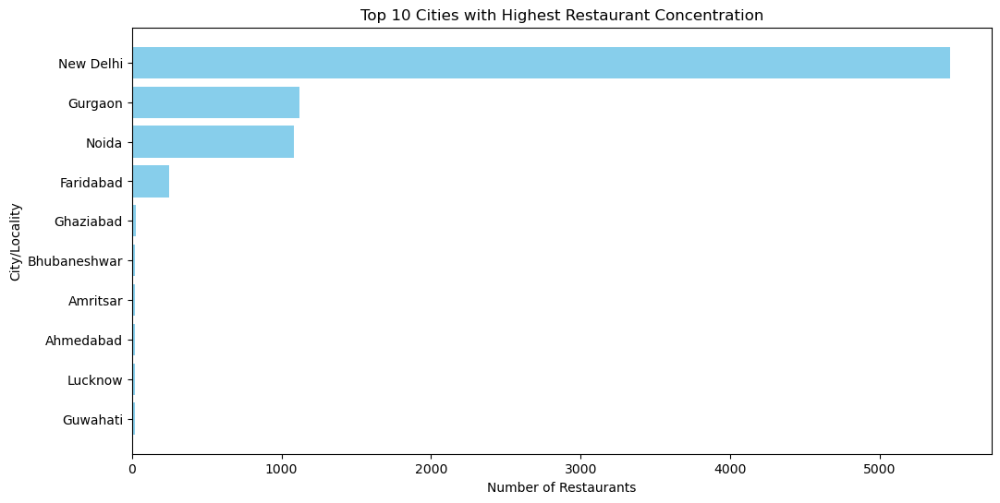

In [32]:
import matplotlib.pyplot as plt
plt.figure(figsize=(12,6))
plt.barh(top_cities["city"], top_cities["restaurant_count"], color="skyblue")
plt.xlabel("Number of Restaurants")
plt.ylabel("City/Locality")
plt.title("Top 10 Cities with Highest Restaurant Concentration")
plt.gca().invert_yaxis()  # Invert y-axis for better readability
plt.show()


In [48]:
m_city = folium.Map(location=[center_lat, center_lon], zoom_start=5)
m_city

In [52]:
# Grouping by City to calculate average ratings and price ranges
city_stats = res.groupby("City").agg(
    Avg_Rating=("Aggregate rating", "mean"),
    Avg_Price=("Average Cost for two", "mean"),
    Unique_Cuisines=("Cuisines", lambda x: len(set(x.dropna())))  # Count unique cuisines per city
).reset_index()

# Sorting cities by highest average rating
top_rated_cities = city_stats.sort_values(by="Avg_Rating", ascending=False).head(10)

# Display the top 10 rated cities with their statistics
top_rated_cities


,City,Avg_Rating,Avg_Price,Unique_Cuisines
56,Inner City,4.900000,1120.000000,2
107,Quezon City,4.800000,800.000000,1
73,Makati City,4.650000,1150.000000,2
95,Pasig City,4.633333,933.333333,3
75,Mandaluyong City,4.625000,2000.000000,4
15,Beechworth,4.600000,20.000000,1
67,London,4.535000,64.500000,15
123,Taguig City,4.525000,1725.000000,4
122,Tagaytay City,4.500000,1200.000000,1
116,Secunderabad,4.500000,825.000000,2


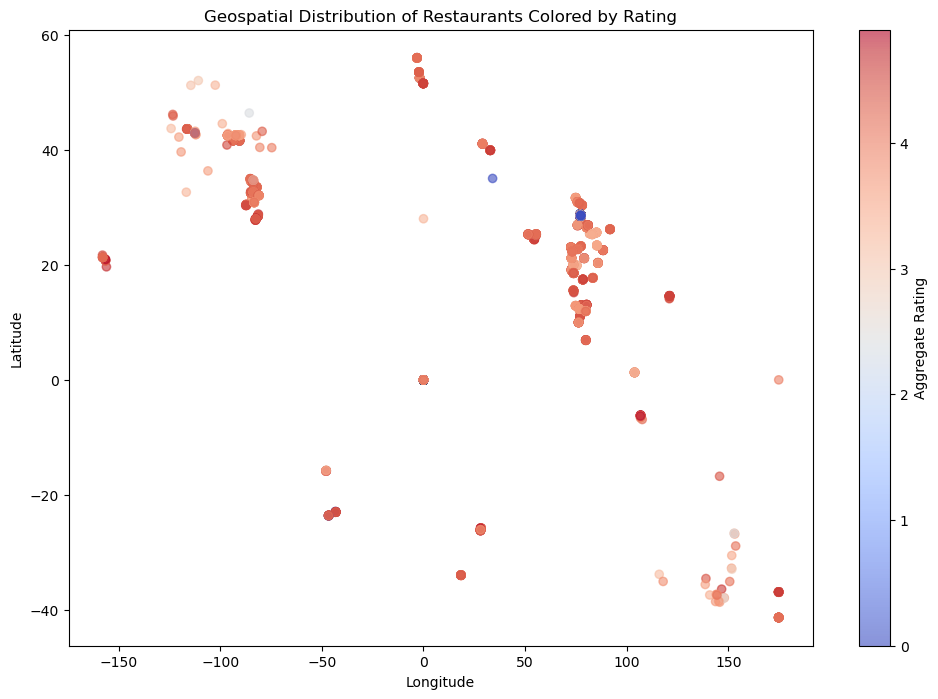

In [54]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(res["Longitude"], res["Latitude"], c=res["Aggregate rating"], cmap="coolwarm", alpha=0.6)
plt.colorbar(scatter, label="Aggregate Rating")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Geospatial Distribution of Restaurants Colored by Rating")
plt.show()

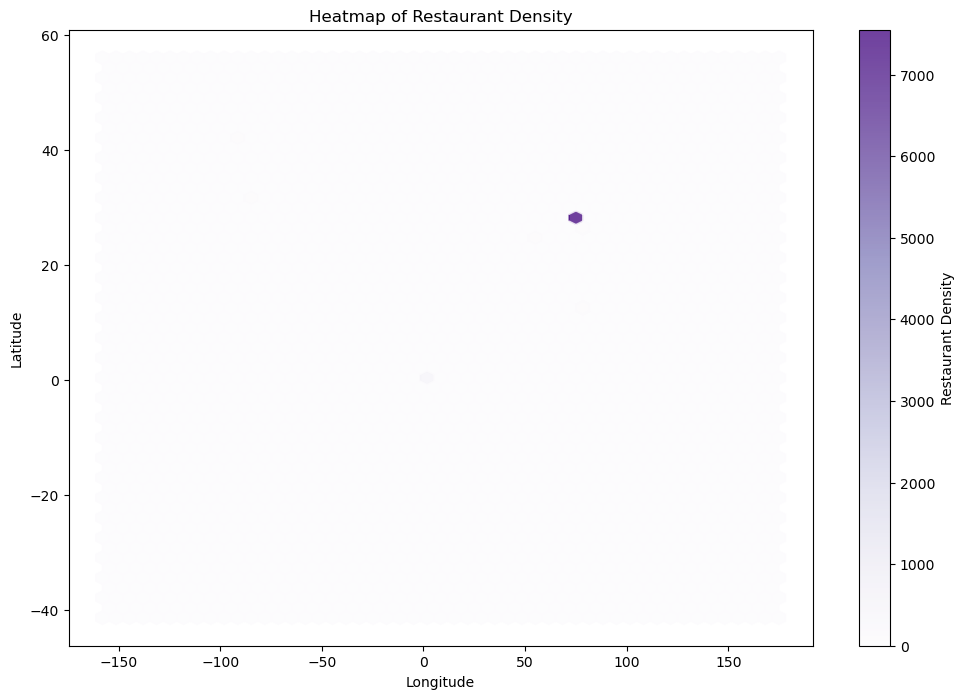

In [56]:
plt.figure(figsize=(12,8))
hb = plt.hexbin(res["Longitude"], res["Latitude"], gridsize=50, cmap="Purples", alpha=0.75)
plt.colorbar(hb, label="Restaurant Density")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Heatmap of Restaurant Density")
plt.show()

In [60]:
city_name = "New Delhi"
restaurant_count = res["City"].value_counts().max()
print(f"Number of restaurants in {city_name}: {restaurant_count}")


Number of restaurants in New Delhi: 5473
